In [8]:
import pandas as pd
import numpy as np
import hvplot.pandas

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

from pathlib import Path
import plotly.express as px         # to create 3D scatter plot
import matplotlib.pyplot as plt     # to display the plot

print("all done")

all done


In [9]:
clustered_df = pd.read_csv('resources/clustered.csv')
clustered_df.head(10)

,Date,WIND,SKY,VIS,TEMP,DEW,SLP,PC1,PC2,PC3,Class
0,2013-01-01 00:10:00,88,549,4828,28.0,260,260,-1.423769,1.543557,2.126290,1
1,2013-01-01 00:54:00,57,610,6437,27.8,261,261,-1.780070,1.347266,0.891894,1
2,2013-01-01 01:32:00,62,884,6437,28.0,260,260,-1.648587,1.273779,1.098585,1
3,2013-01-01 02:43:00,77,640,4828,28.0,260,260,-1.529425,1.530861,1.716051,1
4,2013-01-01 02:54:00,82,945,16093,28.3,261,261,-1.418587,-0.204046,1.586666,0
5,2013-01-01 03:25:00,82,732,16093,29.0,260,260,-1.363767,-0.405639,1.727823,0
6,2013-01-01 03:40:00,82,488,16093,29.0,260,260,-1.364102,-0.392472,1.734897,0
7,2013-01-01 04:49:00,82,884,16093,29.0,260,260,-1.363558,-0.413842,1.723417,0
8,2013-01-01 04:54:00,77,792,16093,28.9,256,256,-1.029424,-0.389841,1.468144,0
9,2013-01-01 06:51:00,72,732,16093,29.0,250,250,-0.518030,-0.431705,1.228419,0


Visualizing Results
3d-Scatter with Clusters

In [10]:
# Creating a 3D-Scatter with the PCA data and the clusters. 
fig = px.scatter_3d(clustered_df,
    x='PC1',
    y='PC2',
    z='PC3',
    hover_name="Date",
    color="Class",
    symbol="Class",            
)

fig.update_layout(legend=dict(x=0, y=1))
fig.show()

In [11]:
# Create a table with the climate data.
clustered_df.hvplot.table(columns=["WIND", "SKY", "VIS", "TEMP", "DEW", "SLP"], 
                          sortable=True, selectable=True)

:Table   [WIND,SKY,VIS,TEMP,DEW,SLP]

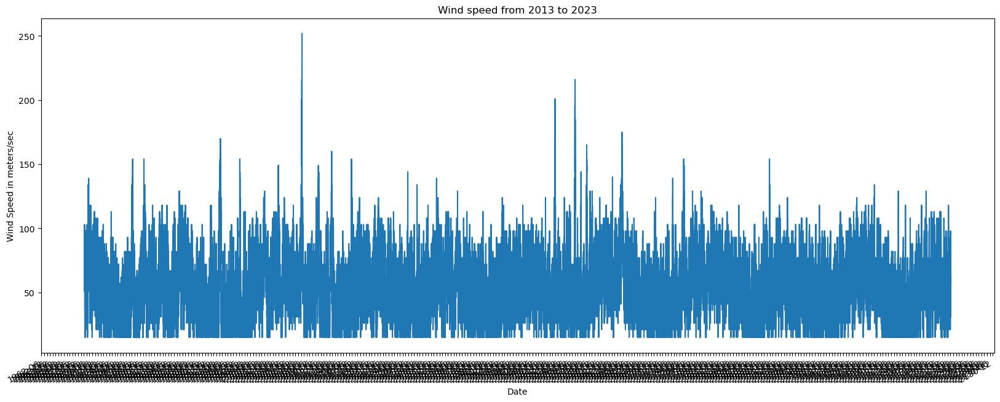

In [12]:
import matplotlib.dates as mdates
date = clustered_df["Date"]
wind_speed = clustered_df["WIND"]
half_year_locator = mdates.MonthLocator(interval=6)
year_month_formatter = mdates.DateFormatter("%Y-%m") # four digits for year, two for month

fig, ax = plt.subplots(figsize=(20, 8))
ax.xaxis.set_major_locator(half_year_locator)
ax.xaxis.set_major_formatter(year_month_formatter) # formatter for major axis only
ax.set_title("Wind speed from 2013 to 2023")
ax.set(xlabel="Date", ylabel="Wind Speed in meters/sec")
fig.autofmt_xdate()
ax.plot(date, wind_speed);

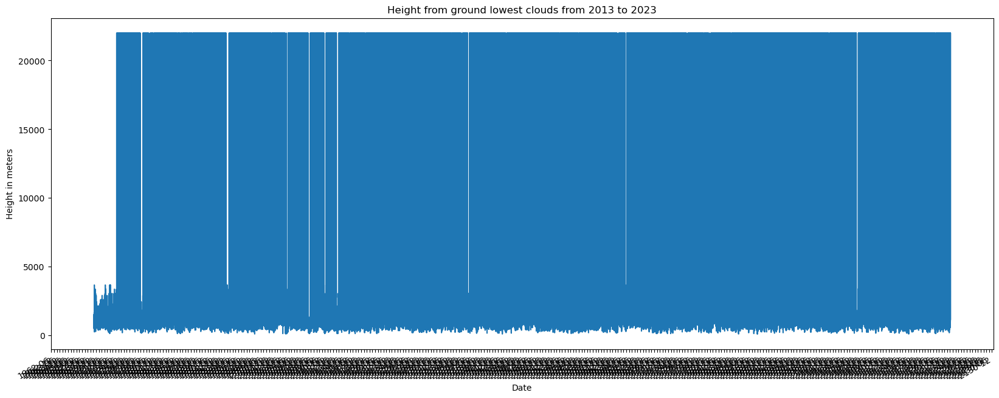

In [13]:
cloud_height_from_ground = clustered_df["SKY"]
fig, ax = plt.subplots(figsize=(20, 8))
ax.xaxis.set_major_locator(half_year_locator)
ax.xaxis.set_major_formatter(year_month_formatter) # formatter for major axis only
ax.set_title("Height from ground lowest clouds from 2013 to 2023")
ax.set(xlabel="Date", ylabel="Height in meters")
fig.autofmt_xdate()
ax.plot(date, cloud_height_from_ground);

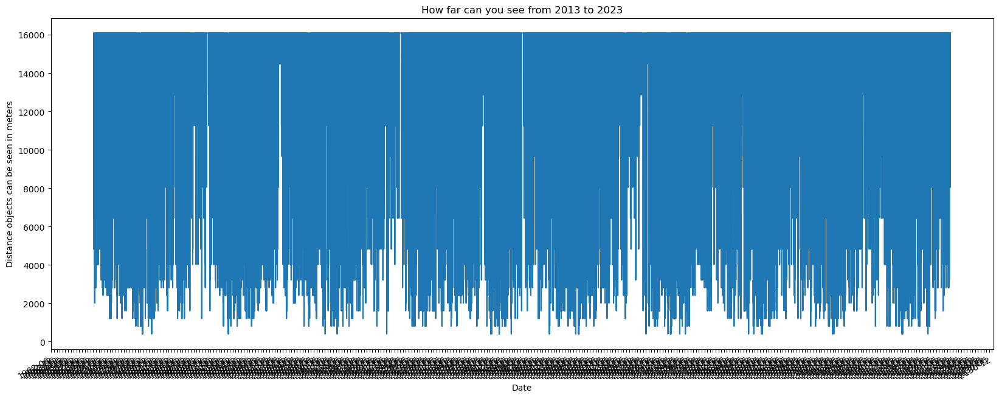

In [14]:
horizontal_visibility = clustered_df["VIS"]
fig, ax = plt.subplots(figsize=(20, 8))
ax.xaxis.set_major_locator(half_year_locator)
ax.xaxis.set_major_formatter(year_month_formatter) # formatter for major axis only
ax.set_title("How far can you see from 2013 to 2023")
ax.set(xlabel="Date", ylabel="Distance objects can be seen in meters")
fig.autofmt_xdate()
ax.plot(date, horizontal_visibility);

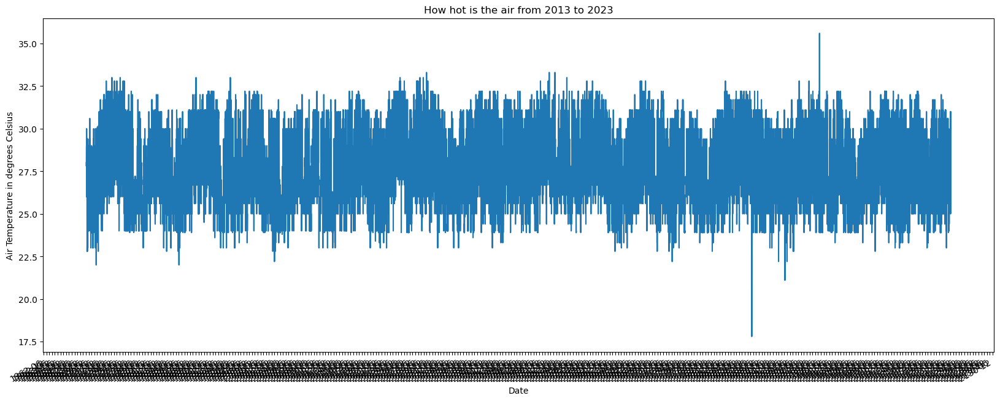

In [15]:
air_temp = clustered_df["TEMP"]
fig, ax = plt.subplots(figsize=(20, 8))
ax.xaxis.set_major_locator(half_year_locator)
ax.xaxis.set_major_formatter(year_month_formatter) # formatter for major axis only
ax.set_title("How hot is the air from 2013 to 2023")
ax.set(xlabel="Date", ylabel="Air Temperature in degrees Celsius")
fig.autofmt_xdate()
ax.plot(date, air_temp);

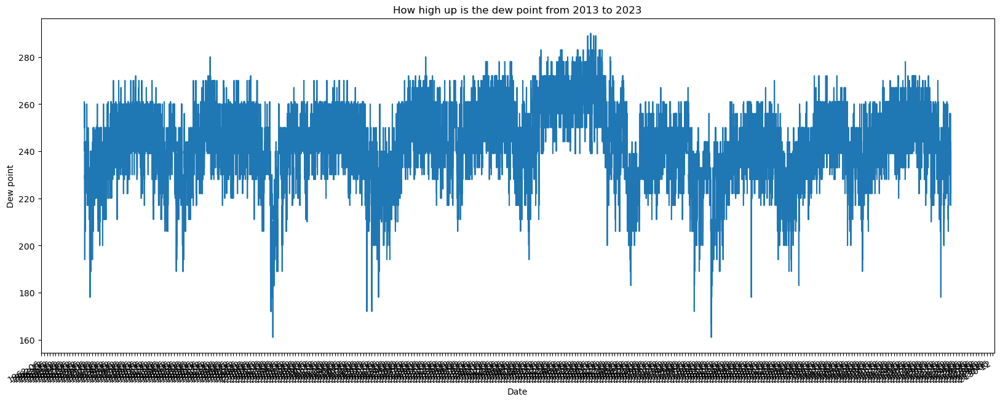

In [16]:
dew_point = clustered_df["DEW"]
fig, ax = plt.subplots(figsize=(20, 8))
ax.xaxis.set_major_locator(half_year_locator)
ax.xaxis.set_major_formatter(year_month_formatter) # formatter for major axis only
ax.set_title("How high up is the dew point from 2013 to 2023")
ax.set(xlabel="Date", ylabel="Dew point")
fig.autofmt_xdate()
ax.plot(date, dew_point);